# Multi-Model Fusion for Animal Detection and Classification

This notebook implements a multi-model fusion approach that combines YOLO object detection and two different classifiers (YOLO classifier and EfficientNet) for improved animal classification. The approach uses cross-attention to effectively combine features from both classification models.

## Install Dependencies


In [24]:
# Install Dependencies (if needed)
%pip install ultralytics torch torchvision opencv-python-headless

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


## Import Libraries

Import all required Python libraries for our project.

In [25]:
# %pip uninstall -y torch torchvision
# %pip install torch torchvision
import os
import logging
import cv2
import numpy as np
import torch
import torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from ultralytics import YOLO
from sklearn.metrics import classification_report
from ultralytics.utils import LOGGER
LOGGER.setLevel(logging.ERROR)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"★ Using {device}")


★ Using cuda


## Initialize Models and Freeze Weights

We'll use three pre-trained models:
1. YOLO detection model - to detect animals in images
2. YOLO classifier - for feature extraction and classification
3. EfficientNet - for additional feature extraction and classification

We freeze the weights of all three models as we'll use them as feature extractors.

In [26]:
from PytorchWildlife.models import detection as pw_detection
from PytorchWildlife import utils as pw_utils

# Swap out YOLO for MegaDetectorV6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
detection_model = pw_detection.MegaDetectorV6(
    version="MDV6-yolov9-e",
    device=device,
    pretrained=True
)

# Classification Models
yolo_cls = YOLO('yolo11x-cls.pt').eval()
effnet = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1).eval()

# Freeze classifiers
for model in [yolo_cls, effnet]:
    for p in model.parameters():
        p.requires_grad_(False)

# Define device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")


Using device: cuda


## Map Model Categories to high-level classes

Create a mapping from the classes output from the classification models to our own high level classes

In [27]:
def get_animal_category_mapping():
    """
    Define mappings from specific species to our 4 high-level categories
    """
    big_cats = ['tiger', 'lion', 'leopard', 'cheetah', 'jaguar', 'puma', 'lynx', 'cougar', 'panther','snow leopard']
    bears = ['bear', 'brown bear', 'polar bear', 'grizzly', 'black bear', 'panda','American_black_bear']
    deers = ['deer', 'elk', 'moose', 'reindeer', 'antelope', 'gazelle', 'impala']
    big_dogs = ['wolf', 'coyote', 'fox', 'hyena', 'jackal', 'dingo', 'wild dog']
    
    yolo_classes = detection_model.names
    
    yolo_mapping = {}
    
    for idx, name in yolo_classes.items():
        name = name.lower()
        if any(cat in name for cat in big_cats):
            yolo_mapping[idx] = 0  # big cat
        elif any(cat in name for cat in bears):
            yolo_mapping[idx] = 1  # bear
        elif any(cat in name for cat in deers):
            yolo_mapping[idx] = 2  # deer
        elif any(cat in name for cat in big_dogs):
            yolo_mapping[idx] = 3  # big dog
    
    return {
        "mapping": yolo_mapping,
        "category_names": ["big cat", "bear", "deer", "big dog"]
    }


## Create Custom Dataset for Animal Detection

We implement a custom PyTorch Dataset that:
1. Loads images from a directory
2. Uses the YOLO detection model to identify animals
3. Crops the regions containing animals
4. Transforms these crops for use with our classifiers
5. Handles train/test splitting and class imbalance

In [28]:
#Training transform: Apply data augmentation to improve model generalization
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
])

#Testing: Only resize and normalize, no augmentation
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

class AnimalDataset(Dataset):
    """

    Custom PyTorch dataset for animal classification with detection-based cropping.
    
    root_dir/
        big cats/
        bear/
        deer/
        big dog/
    """
    def __init__(self,
                 root_dir: str,
                 img_size: int = 224,
                 split: str = "train",
                 train_ratio: float = 0.8,
                 transform=None):

        self.root_dir  = root_dir
        self.split     = split
        self.img_size  = img_size
        self.transform = transform or transforms.Compose([
            transforms.Resize((img_size, img_size)),
            transforms.ToTensor()
        ])

        #Scans the directory and also the subdirectory for images 
        self.classes      = sorted([d for d in os.listdir(root_dir)
                                    if os.path.isdir(os.path.join(root_dir, d))])
        self.class_to_idx = {c: i for i, c in enumerate(self.classes)}

        self.image_paths, self.labels = [], []
        for cls in self.classes:
            cls_dir = os.path.join(root_dir, cls)
            for f in os.listdir(cls_dir):
                if f.lower().endswith((".jpg", ".jpeg", ".png")):
                    self.image_paths.append(os.path.join(cls_dir, f))
                    self.labels.append(self.class_to_idx[cls])

        
        idxs = np.random.permutation(len(self.image_paths))
        cut  = int(len(idxs) * train_ratio)
        self.idxs = idxs[:cut] if split == "train" else idxs[cut:]

        # (optional) weights for imbalance
        if split == "train":
            counts   = np.bincount(np.array(self.labels)[self.idxs],
                                   minlength=len(self.classes))
            self.weights = 1. / counts[self.labels][self.idxs]
        print(f"✔ {split}: {len(self.idxs)} samples  | classes = {self.classes}")

    # ----------------------------------------------------------------------
    # PyTorch mandatory
    # ----------------------------------------------------------------------
    def __len__(self):
        return len(self.idxs)

    def __getitem__(self, i):
        # --------------------------------------------------------------
        # 1. read image + label
        # --------------------------------------------------------------
        real_idx = self.idxs[i]
        img_path = self.image_paths[real_idx]
        label    = self.labels[real_idx]

        img    = Image.open(img_path).convert("RGB")
        np_img = np.array(img)

        # --------------------------------------------------------------
        # 2. detector – crop OR fallback to full image (MegaDetectorV6)
        # --------------------------------------------------------------
        try:
            results    = detection_model.single_image_detection(img_path)
            dets       = results["detections"]
            raw_boxes  = dets.xyxy          # array of [x1, y1, x2, y2]
            raw_cls    = dets.class_id      # array of class indices

            # keep only boxes whose class name == "animal"
            animal_boxes = [
                bbox for bbox, cls in zip(raw_boxes, raw_cls)
                if detection_model.CLASS_NAMES[int(cls)] == "animal"
            ]

            if animal_boxes:
                boxes = np.stack(animal_boxes, axis=0)
            else:
                boxes = np.empty((0, 4))
        except Exception:
            boxes = np.empty((0, 4))

        if boxes.size:  # at least one animal box
            x1, y1, x2, y2 = map(int, boxes[0])
            x2 = max(x2, x1 + 1);  y2 = max(y2, y1 + 1)  # safety

            # expand the bbox by 25%
            w = x2 - x1
            h = y2 - y1
            pad_w = int(w * 0.25)
            pad_h = int(h * 0.25)

            x1 = max(0, x1 - pad_w)
            y1 = max(0, y1 - pad_h)
            x2 = min(img.width,  x2 + pad_w)
            y2 = min(img.height, y2 + pad_h)

            crop = img.crop((x1, y1, x2, y2))
        else:
            crop = img  # fallback = full image

        # --------------------------------------------------------------
        # 3. transform → tensor
        # --------------------------------------------------------------
        tensor = self.transform(crop)
        return tensor, label




### Display Random Imgaes from the dataset with their cropped version to check the working of the detector

In [29]:
def show_random_animal_crops(dataset, num_samples=3, max_crops_per_image=5):
    """
    Randomly selects images from a dataset and displays their original (input)
    and cropped animal regions (output) inline using IPython.display.
    """
    import numpy as np
    from PIL import Image
    from IPython.display import display, HTML

    # Sample random indices from the dataset
    indices = np.random.choice(len(dataset.idxs),
                               min(num_samples, len(dataset.idxs)),
                               replace=False)

    for idx in indices:
        true_idx   = dataset.idxs[idx]
        img_path   = dataset.image_paths[true_idx]
        class_name = dataset.classes[dataset.labels[true_idx]]

        display(HTML(f"<h4>Example from class: {class_name}</h4>"))
        display(HTML(f"<b>Input image:</b> {img_path}"))

        # Load original image
        orig_img = Image.open(img_path).convert("RGB")

        # Run detection
        results      = detection_model.single_image_detection(img_path)
        dets         = results["detections"]
        animal_boxes = [
            bbox.tolist()
            for bbox, cls in zip(dets.xyxy, dets.class_id)
            if detection_model.CLASS_NAMES[int(cls)] == "animal"
        ]

        # Crop up to max_crops_per_image
        output_crops = []
        for bbox in animal_boxes[:max_crops_per_image]:
            x1, y1, x2, y2 = map(int, bbox)
            x2 = max(x2, x1 + 1);  y2 = max(y2, y1 + 1)

            # expand by 25%
            w = x2 - x1
            h = y2 - y1
            pad_w = int(w * 0.55)
            pad_h = int(h * 0.55)

            x1 = max(0, x1 - pad_w)
            y1 = max(0, y1 - pad_h)
            x2 = min(orig_img.width,  x2 + pad_w)
            y2 = min(orig_img.height, y2 + pad_h)

            output_crops.append(orig_img.crop((x1, y1, x2, y2)))

        if not output_crops:
            display(HTML("<i>No animal detected → showing full image</i>"))
            display(orig_img)
        else:
            for i, crop in enumerate(output_crops, start=1):
                display(HTML(f"<b>Crop {i}:</b>"))
                display(crop)

        display(HTML(f"<hr><b>Found {len(output_crops)} animal crop(s)</b><br><br>"))


## 5. Implement Feature Extractors

To leverage the power of both YOLO and EfficientNet, we create feature extractor classes that will extract features from the intermediate layers of these models instead of using just their final classification output.

In [30]:
class YOLOFeatureExtractor(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        # We always run inference here, so wrap in no_grad
        with torch.no_grad():
            try:
                # If your ultralytics version supports feat_extract:
                out = self.model(x, feat_extract=True)
                feats = out.features              # [B, C, H, W]
                feats = feats.flatten(1)          # → [B, C*H*W]
            except Exception:
                results = self.model(x)           # returns a list of length B
                feat_list = []
                for res in results:
                    # if it has intermediate features
                    if hasattr(res, 'features'):
                        f = res.features.flatten(1)
                    else:
                        # classification probs → [num_classes] or [1,num_classes]
                        p = res.probs.data
                        f = p if p.ndim == 2 else p.unsqueeze(0)
                    feat_list.append(f)
                # now stack back into a [B, D] tensor
                feats = torch.cat(feat_list, dim=0)
        return feats.to(x.device)


# For EfficientNet
class EffNetFeatureExtractor(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.features = nn.Sequential(
            model.features,
            model.avgpool
        )
        self.flatten = nn.Flatten()
    
    def forward(self, x):
        x = self.features(x)
        return self.flatten(x)

# Initialize feature extractors
yolo_feature_extractor = YOLOFeatureExtractor(yolo_cls).to(device)
effnet_feature_extractor = EffNetFeatureExtractor(effnet).to(device)
dummy = torch.zeros(1, 3, 224, 224).to(device)
with torch.no_grad():
    yolo_dummy_feats   = yolo_feature_extractor(dummy)
    effnet_dummy_feats = effnet_feature_extractor(dummy)

yolo_dim   = yolo_dummy_feats.shape[1]
effnet_dim = effnet_dummy_feats.shape[1]
print(f"Detected feature dims → YOLO: {yolo_dim}, EffNet: {effnet_dim}")

Detected feature dims → YOLO: 1000, EffNet: 1280


## 6. Build Fusion Model with Cross-Attention

We implement a fusion model that uses cross-attention to combine features from both YOLO classifier and EfficientNet. This allows the model to leverage the strengths of both architectures for better classification performance.

In [31]:
class CrossAttentionFusion(nn.Module):
    def __init__(self, yolo_dim, effnet_dim, num_classes):
        super().__init__()
        self.embed_dim = 512
        self.num_heads = 8
        
        # Make sure embed_dim is divisible by num_heads
        assert self.embed_dim % self.num_heads == 0, "embed_dim must be divisible by num_heads"
        
        self.yolo_proj = nn.Linear(yolo_dim, self.embed_dim)
        self.effnet_proj = nn.Linear(effnet_dim, self.embed_dim)
        
        self.attention = nn.MultiheadAttention(embed_dim=self.embed_dim, num_heads=self.num_heads)
        self.classifier = nn.Sequential(
            nn.Linear(self.embed_dim*2, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes)
        )
    
    def forward(self, yolo_feats, effnet_feats):
        # Ensure both inputs have same batch size
        batch_size = min(yolo_feats.size(0), effnet_feats.size(0))
        
        # Trim if necessary
        if yolo_feats.size(0) > batch_size:
            yolo_feats = yolo_feats[:batch_size]
        if effnet_feats.size(0) > batch_size:
            effnet_feats = effnet_feats[:batch_size]
            
        # Project features
        y = self.yolo_proj(yolo_feats)      # [B, 512]
        e = self.effnet_proj(effnet_feats)  # [B, 512]
        
        # Create sequence from features (treat each model's features as a token)
        # Each sample will have 2 tokens: YOLO features and EfficientNet features
        y_seq = y.unsqueeze(1)  # [B, 1, 512]
        e_seq = e.unsqueeze(1)  # [B, 1, 512]
        
        # Concatenate to form sequences - each sequence has 2 elements
        seq = torch.cat([y_seq, e_seq], dim=1)  # [B, 2, 512]
        
        # Transpose for attention: [sequence_length, batch_size, embed_dim]
        seq = seq.transpose(0, 1)  # [2, B, 512]
        
        # Self-attention: each position attends to both positions
        # This lets YOLO features attend to EfficientNet features and vice versa
        attn_out, _ = self.attention(seq, seq, seq)  # [2, B, 512]
        
        # Transpose back: [batch_size, sequence_length, embed_dim]
        attn_out = attn_out.transpose(0, 1)  # [B, 2, 512]
        
        # Extract attended features
        y_attended = attn_out[:, 0]  # [B, 512] - attended YOLO features
        e_attended = attn_out[:, 1]  # [B, 512] - attended EfficientNet features
        
        # Combine original and attended features
        combined = torch.cat([y_attended, e_attended], dim=1)  # [B, 1024]
        
        # Pass through classifier
        return self.classifier(combined)



## 7. Configure Training Setup

Set up the dataset, data loader, loss function, and optimizer for training the fusion model.

✔ train: 5481 samples  | classes = ['bear', 'big cat', 'big dog', 'deer']
✔ test: 1371 samples  | classes = ['bear', 'big cat', 'big dog', 'deer']
Detected feature dims → YOLO: 1000, EffNet: 1280


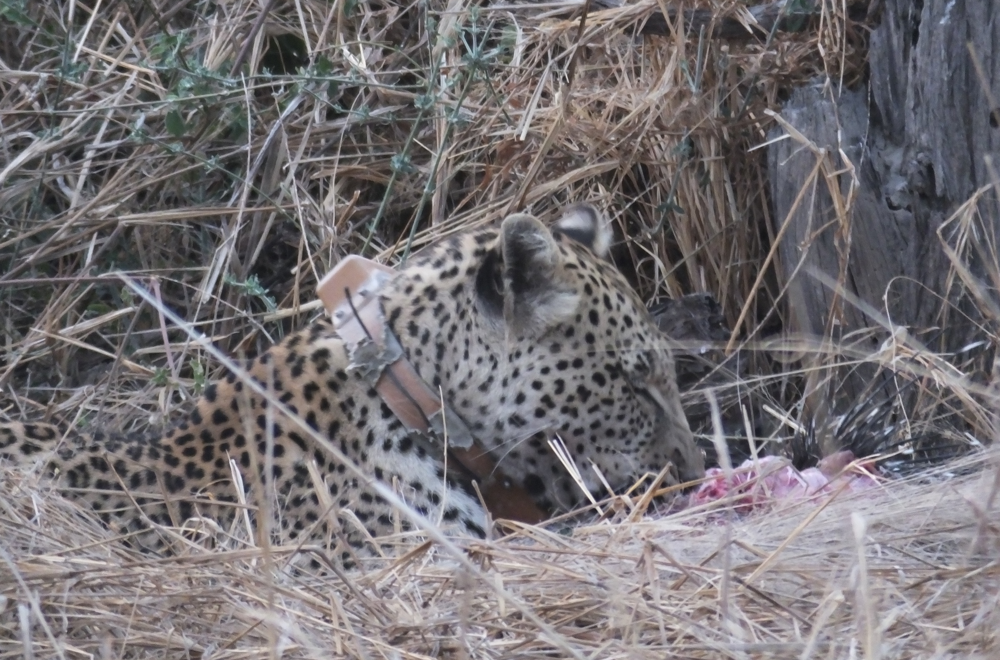

Training dataset contains 5481 images
Test dataset contains 1371 images
Using batch size of 8


In [32]:
dataset_path = r"D:\SPRING 2025\Deep Learning\PROJECT\Datasets_MAIN\small_training_dataset"

# Create datasets with proper train/test split
train_dataset = AnimalDataset(dataset_path, split='train', transform=train_transform)
test_dataset = AnimalDataset(dataset_path, split='test', transform=test_transform)

# Create sampler to handle class imbalance
train_sampler = torch.utils.data.WeightedRandomSampler(
    weights=train_dataset.weights,
    num_samples=len(train_dataset),
    replacement=True
)

# Create data loaders
train_loader = DataLoader(
    train_dataset, 
    batch_size=8,  # Reduced batch size for stability
    sampler=train_sampler,
    num_workers=0,  # Disable multiprocessing for now
    persistent_workers=False
)

test_loader = DataLoader(
    test_dataset, 
    batch_size=8,  # Reduced batch size
    shuffle=False,
    num_workers=0,  # Disable multiprocessing
    persistent_workers=False
)


dummy = torch.zeros(1, 3, 224, 224).to(device)
with torch.no_grad():
    yolo_dim   = yolo_feature_extractor(dummy).shape[1]
    effnet_dim = effnet_feature_extractor(dummy).shape[1]
print(f"Detected feature dims → YOLO: {yolo_dim}, EffNet: {effnet_dim}")

# 2. Re‐instantiate fusion model with the correct dims
fusion_model = CrossAttentionFusion(
    yolo_dim=yolo_dim,
    effnet_dim=effnet_dim,
    num_classes=len(train_dataset.classes)
).to(device)

# 3. Then define loss & optimizer as before
class_counts = np.bincount([train_dataset.labels[idx] for idx in train_dataset.idxs])
class_weights = 1. / (class_counts / sum(class_counts))
class_weights = torch.FloatTensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights) #weighted cross entropy loss

show_random_animal_crops(train_dataset, num_samples=1, max_crops_per_image=5)
optimizer = torch.optim.Adam(fusion_model.parameters(), lr=1e-4)
print(f"Training dataset contains {len(train_dataset)} images")
print(f"Test dataset contains {len(test_dataset)} images")
print(f"Using batch size of {train_loader.batch_size}")


## 8. Execute Training Loop

Now we implement the training loop that:
1. Processes batches of images
2. Extracts features using our feature extractors
3. Passes them through the fusion model
4. Calculates loss and updates weights

In [ ]:
num_epochs = 10
best_loss = float('inf')

for epoch in range(num_epochs):
    fusion_model.train()
    running_loss = 0.0
    valid_batches = 0
    
    # Wrap in try-except to catch and report any errors
    try:
        for inputs, labels in tqdm(train_loader, desc=f'Epoch {epoch+1}'):
            # Skip completely empty batches
            if inputs.shape[0] == 0:
                continue
                
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            # Skip invalid samples
            valid_idx = labels != -1
            if not valid_idx.any():
                continue
                
            inputs = inputs[valid_idx]
            labels = labels[valid_idx]
            
            # Feature extraction
            try:
                batch_size = inputs.shape[0]
                yolo_feats_list = []
                effnet_feats_list = []

                for i in range(batch_size):
                    with torch.no_grad():
                        single_input = inputs[i:i+1]  # Keep dimension: [1, C, H, W]
                        yf = yolo_feature_extractor(single_input)
                        ef = effnet_feature_extractor(single_input)
                    yolo_feats_list.append(yf)
                    effnet_feats_list.append(ef)

                yolo_feats = torch.cat(yolo_feats_list, dim=0)  # [B, D]
                effnet_feats = torch.cat(effnet_feats_list, dim=0)  # [B, D]`
                    
                # yolo_feats = yolo_feats.clone().detach()          # ← **fix**
                # effnet_feats = effnet_feats.clone().detach()          # ← **fix**
                
                # Forward + backward
                optimizer.zero_grad()
                outputs = fusion_model(yolo_feats, effnet_feats)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                
                running_loss += loss.item()
                valid_batches += 1
            except Exception as e:
                print(f"Error in batch processing: {e}")
                continue
        
        # Calculate average loss
        epoch_loss = running_loss / max(1, valid_batches)
        print(f'Epoch {epoch+1} Loss: {epoch_loss:.4f}')
        
        # Save best model
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            torch.save(fusion_model.state_dict(), 'best_animal_fusion_model_1st_improvement_with_Mega_Detector.pth')
            print(f"Saved best model with loss: {best_loss:.4f}")
            
    except Exception as e:
        print(f"Error in epoch {epoch+1}: {e}")
        continue

# Save the final model
# torch.save(fusion_model.state_dict(), 'final_animal_fusion_model.pth')

In [ ]:
import os, logging, cv2, numpy as np, torch, torch.nn as nn
from PIL import Image
from tqdm import tqdm
from torchvision import transforms
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from ultralytics import YOLO
from ultralytics.utils import LOGGER
from PytorchWildlife.models import detection as pw_detection
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support, classification_report
import pandas as pd
import shutil
incorrect_others_dir = r"C:\Users\uzair\Downloads\incorrectOthers"
os.makedirs(incorrect_others_dir, exist_ok=True)
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
LOGGER.setLevel(logging.ERROR)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"★ Using {device}")
detection_model = pw_detection.MegaDetectorV6(version="MDV6-yolov9-e", device=device, pretrained=True)
yolo_cls = YOLO("yolo11x-cls.pt").eval()
effnet = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1).eval()
for m in (yolo_cls, effnet): m.requires_grad_(False)
class YOLOFeatureExtractor(nn.Module):
    def __init__(self, model): super().__init__(); self.model = model
    def forward(self, x):
        with torch.no_grad():
            try:
                out = self.model(x, feat_extract=True)
                feats = out.features.flatten(1)
            except Exception:
                results, feat_list = self.model(x), []
                for r in results:
                    if hasattr(r, "features"):
                        f = r.features.flatten(1)
                    elif hasattr(r, "probs"):
                        p = r.probs.data
                        f = p if p.ndim == 2 else p.unsqueeze(0)
                    else:
                        print("Warning: Could not extract features or probs from a result item.")
                        continue
                    feat_list.append(f)
                if not feat_list:
                    print("Warning: No features extracted from YOLO results. Returning zero tensor.")
                    return torch.zeros(x.shape[0], yolo_dim, device=x.device)
                feats = torch.cat(feat_list, 0)
        return feats.to(x.device)
class EffNetFeatureExtractor(nn.Module):
    def __init__(self, model):
        super().__init__(); self.features = nn.Sequential(model.features, model.avgpool)
        self.flatten = nn.Flatten()
    def forward(self, x): return self.flatten(self.features(x))
yolo_feature_extractor = YOLOFeatureExtractor(yolo_cls).to(device)
effnet_feature_extractor = EffNetFeatureExtractor(effnet).to(device)
with torch.no_grad():
    dummy = torch.zeros(1, 3, 224, 224, device=device)
    try:
        yolo_dim = yolo_feature_extractor(dummy).shape[1]
    except Exception as e:
        print(f"Error determining YOLO feature dimension: {e}")
        print("Assuming a default YOLO feature dimension (e.g., 1000 if it's a classifier). Adjust if necessary.")
        yolo_dim = 1000
    effnet_dim = effnet_feature_extractor(dummy).shape[1]
print(f"Detected feature dims → YOLO: {yolo_dim}, EffNet: {effnet_dim}")
class_names = sorted(["bear", "big cat", "big dog", "deer"])
class_to_idx = {c: i for i, c in enumerate(class_names)}
idx_to_class = {i: c for c, i in class_to_idx.items()}
fusion_model = CrossAttentionFusion(yolo_dim, effnet_dim, len(class_names)).to(device)
try:
    fusion_model.load_state_dict(torch.load(r"D:\SPRING 2025\Deep Learning\PROJECT\Group14-ImprovedModel\best_animal_fusion_model_1st_improvement_with_Mega_Detector.pth", map_location=device))
    print("✓ Fusion model state_dict loaded successfully for 4 classes.")
except Exception as e:
    print(f"Error loading fusion model state_dict: {e}")
    print("Please ensure the path is correct and the state_dict matches the 4-class model architecture.")
    exit()
fusion_model.eval()
print("✓ Fusion model configured (4 classes).")
test_root = r"D:\SPRING 2025\Deep Learning\PROJECT\Datasets_MAIN\test_dataset"
test_transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])
CONFIDENCE_THRESH = 0.98
evaluation_labels = sorted(class_names + ["others"])
evaluation_results = {label: [] for label in evaluation_labels}
print(f"\nEvaluating model on: {test_root}")
evaluation_dirs = [os.path.join(test_root, name) for name in evaluation_labels]
for class_name in tqdm(evaluation_labels, desc="Processing classes"):
    class_dir = os.path.join(test_root, class_name)
    if not os.path.isdir(class_dir):
        print(f"Warning: Directory not found for class '{class_name}': {class_dir}. Skipping.")
        continue
    current_ground_truth = class_name
    for fname in os.listdir(class_dir):
        if not fname.lower().endswith((".jpg", ".jpeg", ".png")): continue
        image_path = os.path.join(class_dir, fname)
        try:
            img = cv2.imread(image_path)
            if img is None: continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            dets = detection_model.single_image_detection(image_path)["detections"]
            predicted_class_name = "others"
            pred_prob = 0.0
            if len(dets.xyxy) > 0:
                best_det_idx = 0
                cls_id = int(dets.class_id[best_det_idx])
                det_confidence = dets.confidence[best_det_idx]
                if detection_model.CLASS_NAMES[cls_id] == "animal":
                    x1,y1,x2,y2 = map(int, dets.xyxy[best_det_idx].tolist())
                    w,h = x2-x1, y2-y1
                    pad_ratio = 0.5
                    pad_w, pad_h = int(w*pad_ratio), int(h*pad_ratio)
                    x1,y1 = max(0, x1-pad_w), max(0, y1-pad_h)
                    x2,y2 = min(img.shape[1], x2+pad_w), min(img.shape[0], y2+pad_h)
                    crop = Image.fromarray(img_rgb).crop((x1,y1,x2,y2))
                    inp = test_transform(crop).unsqueeze(0).to(device)
                    with torch.no_grad():
                        yf = yolo_feature_extractor(inp)
                        ef = effnet_feature_extractor(inp)
                        probs_4_classes = torch.softmax(fusion_model(yf,ef), 1)
                    pred_probs_4, pred_indices_4 = torch.max(probs_4_classes, 1)
                    top_4_class_idx = pred_indices_4.item()
                    top_4_class_prob = pred_probs_4.item()
                    top_4_class_name = idx_to_class[top_4_class_idx]
                    if top_4_class_prob >= CONFIDENCE_THRESH:
                        predicted_class_name = top_4_class_name
                        pred_prob = top_4_class_prob
            is_correct = predicted_class_name == current_ground_truth
            if current_ground_truth == "others" and not is_correct:
                try:
                    shutil.copy(image_path, os.path.join(incorrect_others_dir, os.path.basename(image_path)))
                except Exception as copy_err:
                    print(f"⚠️ Could not copy {image_path} → {copy_err}")
            evaluation_results[current_ground_truth].append((image_path, current_ground_truth, predicted_class_name, pred_prob, is_correct))
        except Exception as e:
            evaluation_results[current_ground_truth].append((image_path, current_ground_truth, "Error", 0.0, False))
            print(f"⚠️ {os.path.basename(image_path)} : {e}")
y_true, y_pred, probs = [], [], []
print("\n────────────   Per‑image results   ────────────")
for label in evaluation_labels:
    if label in evaluation_results:
        for img_path, gt, pred, prob, ok in evaluation_results[label]:
            status = "CORRECT" if ok else "INCORRECT"
            print(f"   {os.path.basename(img_path)} → GT={gt}, Pred={pred} ({status}, prob={prob:.4f})")
            y_true.append(gt)
            y_pred.append(pred)
            probs.append(prob)
valid_indices = [i for i, p in enumerate(y_pred) if p != "Error"]
y_true_valid = [y_true[i] for i in valid_indices]
y_pred_valid = [y_pred[i] for i in valid_indices]
if not y_true_valid:
    print("\nNo valid predictions were made. Cannot calculate metrics.")
else:
    overall_acc = accuracy_score(y_true_valid, y_pred_valid) * 100
    print(f"\n★ Overall accuracy : {overall_acc:.2f} %")
    p, r, f1, _ = precision_recall_fscore_support(y_true_valid, y_pred_valid, labels=evaluation_labels, zero_division=0)
    metrics_df = pd.DataFrame({"Precision": p, "Recall": r, "F1‑score": f1}, index=evaluation_labels)
    print("\n────   Precision / Recall / F1   ────")
    print(metrics_df.round(3))
    print("\nMacro‑average (without weighting) :")
    print(metrics_df.mean().round(3))
    all_labels_for_cm = evaluation_labels
    cm = confusion_matrix(y_true_valid, y_pred_valid, labels=all_labels_for_cm)
    df_cm = pd.DataFrame(cm, index=all_labels_for_cm, columns=all_labels_for_cm)
    fig, ax = plt.subplots(figsize=(10, 8))
    im = ax.imshow(df_cm, interpolation="nearest", cmap=plt.cm.Blues, aspect="auto")
    fig.colorbar(im, ax=ax)
    ax.set_xticks(range(len(all_labels_for_cm)))
    ax.set_xticklabels(all_labels_for_cm, rotation=45, ha="right")
    ax.set_yticks(range(len(all_labels_for_cm)))
    ax.set_yticklabels(all_labels_for_cm)
    for i in range(len(all_labels_for_cm)):
        for j in range(len(all_labels_for_cm)):
            ax.text(j, i, df_cm.iloc[i, j], ha="center", va="center", color="white" if cm[i, j] > cm.max() / 2.0 else "black", fontsize=8)
    ax.set_xlabel("Predicted Class", fontsize=12)
    ax.set_ylabel("True Class", fontsize=12)
    ax.set_title("Confusion Matrix", fontsize=14)
    fig.tight_layout()
    cm_png = "confusion_matrix_with_other.png"
    fig.savefig(cm_png, dpi=300)
    plt.close(fig)
    print(f"\n✓ Confusion‑matrix saved to “{cm_png}”.")


★ Using cuda
Detected feature dims → YOLO: 1000, EffNet: 1280
✓ Fusion model state_dict loaded successfully for 4 classes.
✓ Fusion model configured (4 classes).

Evaluating model on: D:\SPRING 2025\Deep Learning\PROJECT\Datasets_MAIN\test_dataset


Processing classes: 100%|██████████| 5/5 [05:53<00:00, 70.68s/it]



────────────   Per‑image results   ────────────
   8784.jpg → GT=bear, Pred=others (INCORRECT, prob=0.0000)
   8789.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8794.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8795.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8796.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8797.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8798.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8799.jpg → GT=bear, Pred=bear (CORRECT, prob=0.9999)
   8801.jpg → GT=bear, Pred=others (INCORRECT, prob=0.0000)
   8803.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8804.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8821.jpg → GT=bear, Pred=bear (CORRECT, prob=0.9998)
   8823.jpg → GT=bear, Pred=bear (CORRECT, prob=0.9999)
   8824.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8825.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8826.jpg → GT=bear, Pred=bear (CORRECT, prob=1.0000)
   8828.jpg → GT=bear, Pred=bear (CORRECT, prob

In [35]:
    # --- EXTRA: concise per‑class metrics (robust to any column names) ---------
print("\n────   Per‑Class Metrics Summary   ────")
report_dict = classification_report(
        y_true_valid,
        y_pred_valid,
        labels=evaluation_labels,
        zero_division=0,
        output_dict=True,   # gives a clean dict we can index safely
    )

for lbl in evaluation_labels:
        prec  = report_dict[lbl]["precision"]
        rec   = report_dict[lbl]["recall"]
        f1_sc = report_dict[lbl]["f1-score"]
        supp  = report_dict[lbl]["support"]
        print(f"{lbl:>10s} :  Precision={prec:.3f}  |  Recall={rec:.3f}  "
              f"|  F1={f1_sc:.3f}  |  Support={supp}")
print("\nEvaluation complete.")



────   Per‑Class Metrics Summary   ────
      bear :  Precision=0.824  |  Recall=0.890  |  F1=0.856  |  Support=300.0
   big cat :  Precision=0.991  |  Recall=0.898  |  F1=0.942  |  Support=500.0
   big dog :  Precision=1.000  |  Recall=0.920  |  F1=0.958  |  Support=500.0
      deer :  Precision=0.857  |  Recall=0.612  |  F1=0.714  |  Support=600.0
    others :  Precision=0.753  |  Recall=0.901  |  F1=0.821  |  Support=1195.0

Evaluation complete.


In [34]:
# ── after you create `fusion_model` and before evaluation ──────────────────
from torchinfo import summary          # pip install torchinfo

# 1) One‑line, shallow summary (top‑level blocks only, param counts only)
print(summary(fusion_model,
        input_data=(torch.zeros(1, yolo_dim).to(device),
                    torch.zeros(1, effnet_dim).to(device)),
        depth=1,                       # show only top‑level layers
        col_names=("num_params",)))

# 2) Just the total parameter count
print(f"Total fusion‑model params: {sum(p.numel() for p in fusion_model.parameters()):,}")


Layer (type:depth-idx)                   Param #
CrossAttentionFusion                     --
├─Linear: 1-1                            512,512
├─Linear: 1-2                            655,872
├─MultiheadAttention: 1-3                1,050,624
├─Sequential: 1-4                        263,428
Total params: 2,482,436
Trainable params: 2,482,436
Non-trainable params: 0
Total mult-adds (Units.MEGABYTES): 1.43
Input size (MB): 0.01
Forward/backward pass size (MB): 0.01
Params size (MB): 5.73
Estimated Total Size (MB): 5.75
Total fusion‑model params: 2,482,436
